In [72]:
# Import libs
import os 
import time
import cv2
from tqdm import tqdm
import numpy as np
import skimage.draw
import random
import keras
import matplotlib.pyplot as plt
import matplotlib.colors
from skimage.transform import resize
import efficientnet.tfkeras
from tensorflow.keras.models import load_model
from scipy import ndimage as ndi
from skimage.segmentation import watershed
from skimage.feature import peak_local_max
import skimage.io
#os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID" 
#os.environ["CUDA_VISIBLE_DEVICES"]="0"

from PIL import Image, ImagePalette
NUCLEI_PALETTE = ImagePalette.random()

def create_directory(directory):
    '''
    Creates a new folder in the specified directory if the folder doesn't exist.
    INPUT
        directory: Folder to be created, called as "folder/".
    OUTPUT
        New folder in the current directory.
    '''
    if not os.path.exists(directory):
        os.makedirs(directory)
        
def convert(img_arr):
    img_arr.astype("float64")
    img_arr = img_arr/255.0
    return img_arr

def uniq(**in_arrs):
    for name, arr in in_arrs.items():
        flat_arr = arr.flatten()
        print("Name: {}, Uniques: {}".format(name, np.unique(flat_arr)))
        
# Name experiment
experiment_name = "exp7"

# Define paths
base_path = os.path.abspath(".")
test_dataset_path = os.path.join(base_path, "testappend", "images/")
MODEL_PATH = os.path.join(base_path, "trained_weights", "ourTestData", "run_1")
print(MODEL_PATH)

/Users/johnshieh/Lab2020/UNetPlusPlus/trained_weights/ourTestData/run_1


In [73]:
model = None
model = load_model('{}/{}.h5'.format(MODEL_PATH, experiment_name), compile=False)
model.summary()

Model: "x-resnet50"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
data (InputLayer)               [(None, None, None,  0                                            
__________________________________________________________________________________________________
bn_data (BatchNormalization)    (None, None, None, 3 9           data[0][0]                       
__________________________________________________________________________________________________
zero_padding2d_1 (ZeroPadding2D (None, None, None, 3 0           bn_data[0][0]                    
__________________________________________________________________________________________________
conv0 (Conv2D)                  (None, None, None, 6 9408        zero_padding2d_1[0][0]           
_________________________________________________________________________________________

In [74]:
def pad(img, pad_size=96):
    """
    Load image from a given path and pad it on the sides, so that eash side is divisible by 96 (network requirement)
    if pad = True:
        returns image as numpy.array, tuple with padding in pixels as(x_min_pad, y_min_pad, x_max_pad, y_max_pad)
    else:
        returns image as numpy.array
    """

    if pad_size == 0:
        return img

    height, width = img.shape[:2]

    if height % pad_size == 0:
        y_min_pad = 0
        y_max_pad = 0
    else:
        y_pad = pad_size - height % pad_size
        y_min_pad = int(y_pad / 2)
        y_max_pad = y_pad - y_min_pad

    if width % pad_size == 0:
        x_min_pad = 0
        x_max_pad = 0
    else:
        x_pad = pad_size - width % pad_size
        x_min_pad = int(x_pad / 2)
        x_max_pad = x_pad - x_min_pad

    img = cv2.copyMakeBorder(img, y_min_pad, y_max_pad, x_min_pad, x_max_pad, cv2.BORDER_REFLECT_101)

    return img, (x_min_pad, y_min_pad, x_max_pad, y_max_pad)



def unpad(img, pads):
    """
    img: numpy array of the shape (height, width)
    pads: (x_min_pad, y_min_pad, x_max_pad, y_max_pad)
    @return padded image
    """
    (x_min_pad, y_min_pad, x_max_pad, y_max_pad) = pads
    height, width = img.shape[:2]

    return img[y_min_pad:height - y_max_pad, x_min_pad:width - x_max_pad]



def read_nuclei(path):
    "read raw data"

    # Load 4-channel image
    img = skimage.io.imread(path)
    
    # input image
    if len(img.shape) > 2:
        img = img[:,:,:3]
    # mask
    else:
        # do nothing
        pass
        
    return img



def save_nuclei(path, img):
    "save image"
    skimage.io.imsave(path, img)

    
def sliding_window(image, step, window):
    x_loc = []
    y_loc = []
    cells = []
    
    for y in range(0, image.shape[0], step):
        for x in range(0, image.shape[1], step):
            cells.append(image[y:y + window[1], x:x + window[0]])
            x_loc.append(x)
            y_loc.append(y)
    return x_loc, y_loc, cells


def extract_patches(image, step, patch_size):
    
    patches = []
    
    # Get locations
    x_pos, y_pos, cells = sliding_window(image, step, (patch_size[0], patch_size[1]))

    for (x, y, cell) in zip(x_pos, y_pos, cells):

        # Get patch
        patch = image[y:y + patch_size[0], x:x + patch_size[0]]

        # Get size
        raw_dim = (patch.shape[1], patch.shape[0]) # W, H
        #print(raw_dim)
        #print(patch.shape)


        if raw_dim != (patch_size[0], patch_size[1]):

            # Resize to 64x64
            #patch = cv2.resize(patch, (64, 64), interpolation = cv2.INTER_AREA)
            patch, pad_locs = pad(patch, pad_size=patch_size[0])
            
            
            # Do stuffffff
            patches.append(patch)
        
        else:

            # Do stuffffff
            patches.append(patch)
    
    patches = np.array(patches)
    
    return patches
    
# Compute Panoptic quality metric for each image
def Panoptic_quality(ground_truth_image,predicted_image):
    TP = 0
    FP = 0
    FN = 0
    sum_IOU = 0
    matched_instances = {}# Create a dictionary to save ground truth indices in keys and predicted matched instances as velues
                        # It will also save IOU of the matched instance in [indx][1]

    # Find matched instances and save it in a dictionary
    for i in np.unique(ground_truth_image):
        if i == 0:
            pass
        else:
            temp_image = np.array(ground_truth_image)
            temp_image = temp_image == i
            matched_image = temp_image * predicted_image
        
            for j in np.unique(matched_image):
                if j == 0:
                    pass
                else:
                    pred_temp = predicted_image == j
                    intersection = sum(sum(temp_image*pred_temp))
                    union = sum(sum(temp_image + pred_temp))
                    IOU = intersection/union
                    if IOU> 0.5:
                        matched_instances [i] = j, IOU 
                        
    # Compute TP, FP, FN and sum of IOU of the matched instances to compute Panoptic Quality               
                        
    pred_indx_list = np.unique(predicted_image)
    pred_indx_list = np.array(pred_indx_list[1:])

    # Loop on ground truth instances
    for indx in np.unique(ground_truth_image):
        if indx == 0:
            pass
        else:
            if indx in matched_instances.keys():
                pred_indx_list = np.delete(pred_indx_list, np.argwhere(pred_indx_list == [indx][0]))
                TP = TP+1
                sum_IOU = sum_IOU+matched_instances[indx][1]
            else:
                FN = FN+1
    FP = len(np.unique(pred_indx_list))
    PQ = sum_IOU/(TP+0.5*FP+0.5*FN)
    
    return PQ

In [75]:
# SAME CODE BLOCK AS IN 6_inference.ipynb

import numpy as np
from skimage.transform import resize

# Helper function for data visualization
def visualize(name1, **images):
    """Plot images in one row."""
    
    norm=plt.Normalize(0,3) # 5 classes including BG
    map_name = matplotlib.colors.LinearSegmentedColormap.from_list("", ["black", "red","yellow","blue"])

    
    n = len(images)
    plt.figure(figsize=(18, 16))
    for i, (name, image) in enumerate(images.items()):
        plt.subplot(1, n, i + 1)
        plt.xticks([])
        plt.yticks([])
        plt.title(' '.join(name.split('_')).title())
        plt.imshow(image, cmap=map_name, norm=norm)
    
    #file = os.path.join(figresults_path, "{}.png".format(name1[:-4]))
    #print(figresults_path)
    #print("filename: " + file)
    #plt.savefig(file, bbox_inches="tight")
    plt.show()
    
    
    
def prep(img):
    img = img.astype('float32')
    img = (img > 0.5).astype(np.uint8)  # threshold
    img = resize(img, (image_cols, image_rows), preserve_range=True)
    return img




def visualize_results(image, mask):
    
    f, axarr = plt.subplots(1,2, figsize=(16, 16))
    
    norm=plt.Normalize(0,3) # 5 classes including BG
    map_name = matplotlib.colors.LinearSegmentedColormap.from_list("", ["black", "red","yellow","blue"])

    axarr[0].imshow(image)
    axarr[1].imshow(mask, cmap=map_name, norm=norm)


    
def vis_gray(image, mask):
    
    f, axarr = plt.subplots(1,2, figsize=(16, 16))
    
    axarr[0].imshow(image)
    axarr[1].imshow(mask, cmap='gray')



def predict(im):
    """Predict on patch"""
    
    im = np.expand_dims(im, axis=0)
    #print("predict func shape 1: {} and type: {}".format(im.shape, im.dtype))
    im2 = model.predict(im)
    print("after predict: ", im2.dtype)
    im2 = np.argmax(im2.squeeze(), axis=-1)
    #assert im.shape == (96, 96), "Wrong shape, {}!".format(im.shape)
    
    return im2



def instance_seg(image):
    distance = ndi.distance_transform_edt(image)
    local_maxi = peak_local_max(distance, indices=False, footprint=np.ones((3, 3)), labels=image)
    markers = ndi.label(local_maxi)[0]
    labels = watershed(-distance, markers, mask=image)
    return labels    



def whole_slide_predict(whole_image):
    
    #import pdb; pdb.set_trace()
    
    # If input image less than patch, infer on whole image
    if whole_image.shape[0] < 96 or whole_image.shape[1] < 96:
        
        # Get size
        raw_dim = (whole_image.shape[1], whole_image.shape[0]) # W, H
        
        # Resize to 64x64 for prediction
        #whole_image_rs = cv2.resize(whole_image, (64, 64), interpolation = cv2.INTER_AREA)
        whole_image_rs, pad_locs = pad(whole_image, pad_size=96)
        
        
        # Infer
        pred2 = predict(whole_image_rs)
        
        
        # Resize back to original shape
        #pred = cv2.resize(pred, raw_dim, interpolation = cv2.INTER_AREA)
        pred2 = unpad(pred2, pad_locs)
        
        # Change dtype for resizing back to original shape
        pred2 = pred2.astype(np.uint8)
        
      
    else:
        
        # Get patch locations
        x_pos, y_pos, cells = sliding_window(whole_image, 96, (96, 96)) 

        # Array for storing predictions
        pred2 = np.zeros((whole_image.shape[0], whole_image.shape[1])).astype(np.uint8)

        # Slide over each patch
        for (x, y, cell) in zip(x_pos, y_pos, cells):

            # Get patch
            patch = whole_image[y:y + 96, x:x + 96]
            print("patch type before: {}".format(patch.dtype))
            patch = convert(patch)
            print("patch type after: {}".format(patch.dtype))

            # Get size
            raw_dim = (patch.shape[1], patch.shape[0]) # W, H

            # If less than patch size, resize and then run prediction
            if raw_dim != (96, 96):


                # Resize to 64x64
                #patch_rs = cv2.resize(patch, (64, 64), interpolation = cv2.INTER_AREA)
                patch_rs, pad_locs = pad(patch, pad_size=96)
                
                #print(patch.dtype, processed.dtype)
                
                assert patch.dtype == patch_rs.dtype, "Wrong data type after resizing!"

                
                # Infer
                processed2 = predict(patch_rs)
                
                # Resize back to original shape
                #processed = cv2.resize(processed, raw_dim, interpolation = cv2.INTER_AREA)
                processed2 = unpad(processed2, pad_locs)

                # Change dtype 
                processed2 = processed2.astype(np.uint8)

                assert patch.shape[:2] == processed2.shape, "Wrong shape!"
                assert patch.dtype == processed2.dtype, "Wrong data type in prediction!"

            else:

                
                # Infer
                processed2 = predict(patch)
                print("after process: ", processed2.dtype)
                
                
                # Change dtype
                processed2 = processed2.astype(np.uint8)
                
                #print(patch.dtype, processed.dtype)
                

                assert patch.shape[:2] == processed2.shape, "Wrong shape!"
                #assert patch.dtype == processed2.dtype, "Wrong data type in prediction!"


            # Add in image variable
            pred2[y:y + 96, x:x + 96] = processed2          
            processed2 = None

    return pred2


Index: 6, Filename: 14.png
Image shape: (96, 96, 3) <class 'numpy.ndarray'>
patch type before: uint8
patch type after: float64
after predict:  float32
after process:  int64
After whole slide predict, dtype: uint8, type: <class 'numpy.ndarray'>
(96, 96, 3) (96, 96)
Uniques predicted [0 1]
Name: pred_mask, Uniques: [0 1]


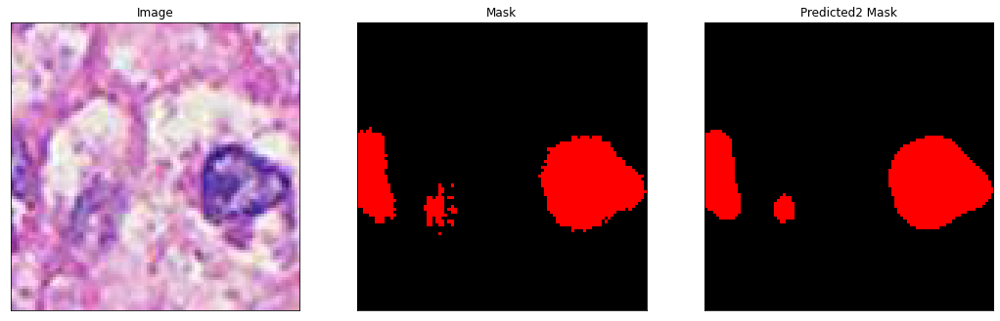

In [82]:
image_fns = sorted(next(os.walk(test_dataset_path))[2])
#print(image_fns)
idx = random.randrange(len(image_fns))
print("Index: {}, Filename: {}".format(idx, image_fns[idx]))

image = skimage.io.imread(os.path.join(test_dataset_path, image_fns[idx]))
print("Image shape:", image.shape, type(image))

pred2 = whole_slide_predict(image)
print("After whole slide predict, dtype: {}, type: {}".format(pred2.dtype, type(pred2)))

# Post processing to refine predictions
pred_filt2 = cv2.medianBlur(pred2.astype(np.uint8), 5)

print(image.shape, pred2.shape)
print("Uniques predicted", np.unique(pred2))
uniq(pred_mask=pred_filt2)
assert image.shape[:2] == pred2.shape, "Image missmatch"

#visualize_results(image, pred)
visualize(
        image_fns[idx],
        image=image,
        mask = pred2,
        Predicted2_mask = pred_filt2
    )

#    label_map = {'normal':1, RED
#             'fibrosis':2, YELLOW
#             'HCC':3, BLUE
#            }

In [6]:
# Dummy mask
zero_mask = np.zeros((pred_filt.shape[0], pred_filt.shape[1])).astype(np.uint8)
# Overlay target class
norm_mask = np.where(pred_filt != 1, zero_mask, 1)
fib_mask = np.where(pred_filt != 2, zero_mask, 2)
HCC_mask = np.where(pred_filt != 3, zero_mask, 3)

# Get uniques for (debugging)
print(norm_mask.shape, fib_mask.shape, HCC_mask.shape)


# Get instances for each class using watershed
norm_mask = instance_seg(norm_mask)
fib_mask = instance_seg(fib_mask)
HCC_mask = instance_seg(HCC_mask)
print(norm_mask.shape, fib_mask.shape, HCC_mask.shape)



# Add color to instances
norm_mask = Image.fromarray(norm_mask.astype(np.uint8), mode='P')
norm_mask.putpalette(NUCLEI_PALETTE)

fib_mask = Image.fromarray(fib_mask.astype(np.uint8), mode='P')
fib_mask.putpalette(NUCLEI_PALETTE)

HCC_mask = Image.fromarray(HCC_mask.astype(np.uint8), mode='P')
HCC_mask.putpalette(NUCLEI_PALETTE)

(512, 512) (512, 512) (512, 512)
(512, 512) (512, 512) (512, 512)


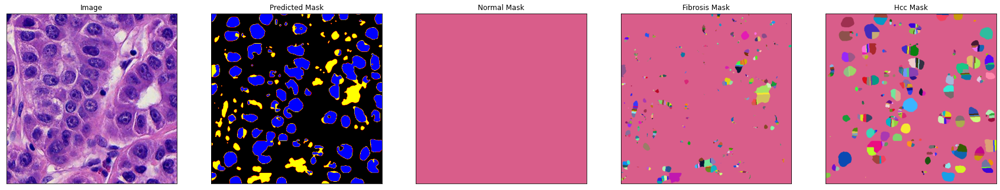

In [7]:
def visualize_inst(**images):
    """Plot images in one row."""
    
    norm=plt.Normalize(0,3) # 5 classes including BG
    map_name = matplotlib.colors.LinearSegmentedColormap.from_list("", ["black", "red","yellow","blue"])

    
    n = len(images)
    plt.figure(figsize=(30, 24))
    for i, (name, image) in enumerate(images.items()):
        
        if name == "GT_mask" or name == "Predicted_mask":
            plt.subplot(1, n, i + 1)
            plt.xticks([])
            plt.yticks([])
            plt.title(' '.join(name.split('_')).title())
            plt.imshow(image, cmap=map_name, norm=norm)
        else:
            plt.subplot(1, n, i + 1)
            plt.xticks([])
            plt.yticks([])
            plt.title(' '.join(name.split('_')).title())
            plt.imshow(image)
    
    plt.savefig("others/result2.png", bbox_inches = 'tight', pad_inches = 0.2, dpi=300)
    plt.show()
    
    
visualize_inst(
        image=image,
        #GT_mask = gt,
        Predicted_mask = pred_filt,
        normal_mask = norm_mask,
        fibrosis_mask = fib_mask,
        HCC_mask = HCC_mask)

  0%|          | 0/71 [00:00<?, ?it/s]

uint8
(1985, 3636, 3) (1985, 3636)
Uniques predicted [0 1 2 3] [0 1 2 3] [0 1 2 3]
case1-40-1_normal.jpg


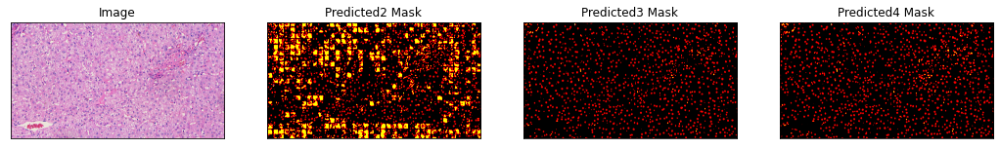

  1%|▏         | 1/71 [01:31<1:46:55, 91.65s/it]

uint8
(300, 300, 3) (300, 300)
Uniques predicted [0 1 2 3] [0 1 2] [0 1 2]
case1-40-1_normal_300.jpg


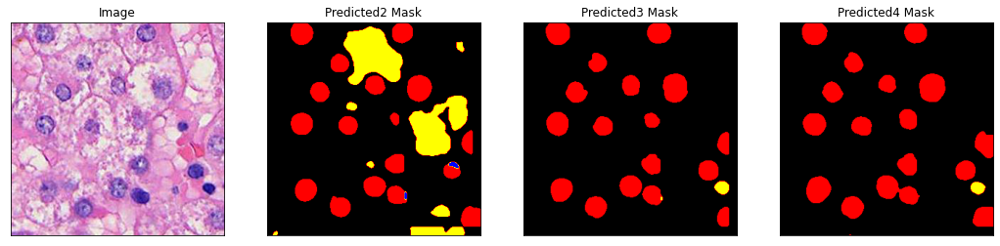

  3%|▎         | 2/71 [01:33<1:14:29, 64.78s/it]

uint8
(229, 229, 3) (229, 229)
Uniques predicted [0 1 2] [0 1 2] [0 1 2]
case1-40-1_normal_512.jpg


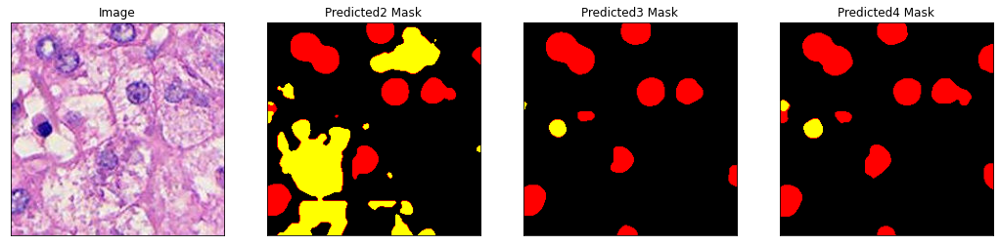

  4%|▍         | 3/71 [01:34<51:49, 45.73s/it]  

uint8
(96, 96, 3) (96, 96)
Uniques predicted [0 1] [0 1] [0 1]
case1-40-1_normal_96.jpg


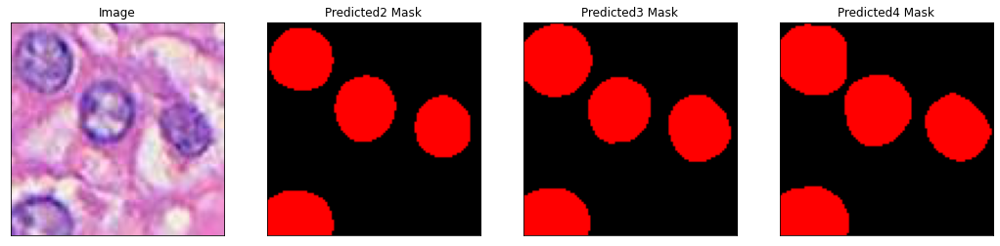

  6%|▌         | 4/71 [01:35<35:52, 32.13s/it]

uint8
(428, 428, 3) (428, 428)
Uniques predicted [0 1 2 3] [0 1 2] [0 1 2 3]
case1-40-1_normal_fibmix.jpg


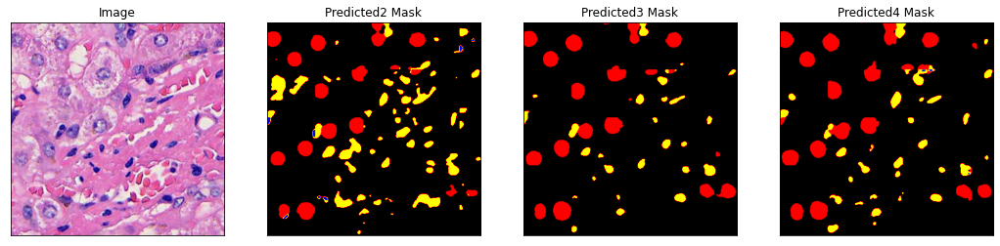

  7%|▋         | 5/71 [01:38<25:45, 23.41s/it]

uint8
(300, 300, 3) (300, 300)
Uniques predicted [0 1 2 3] [0 1 2] [0 1 2]
case1-40-2_normal_300.jpg


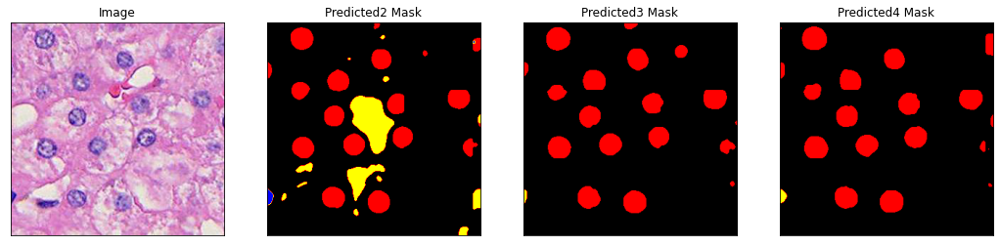

  8%|▊         | 6/71 [01:40<18:24, 17.00s/it]

uint8
(96, 96, 3) (96, 96)
Uniques predicted [0 1 2] [0 1 2] [0 1 2]
case1-40-2_normal_96.jpg


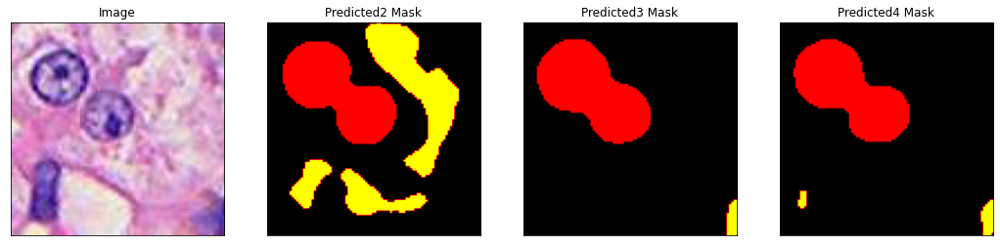

 10%|▉         | 7/71 [01:40<12:49, 12.02s/it]

uint8
(392, 390, 3) (392, 390)
Uniques predicted [0 1 2 3] [0 1 2 3] [0 1 2 3]
case1-40-2_normal_fibmix.jpg


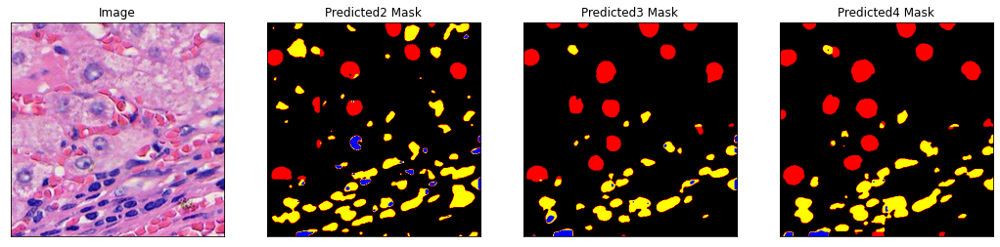

 11%|█▏        | 8/71 [01:43<09:47,  9.32s/it]

uint8
(1985, 3636, 3) (1985, 3636)
Uniques predicted [0 1 2 3] [0 1 2 3] [0 1 2 3]
case1-40-2_normal_fibrosis.jpg


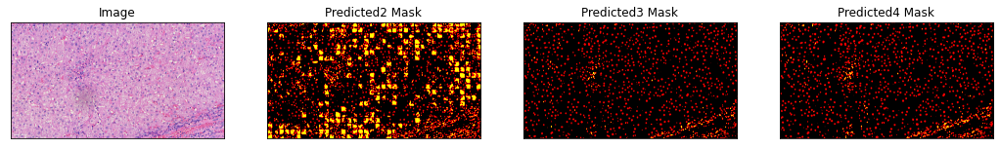

 13%|█▎        | 9/71 [03:14<34:55, 33.81s/it]

uint8
(1985, 3636, 3) (1985, 3636)
Uniques predicted [0 1 2 3] [0 1 2 3] [0 1 2 3]
case2-1-40_normal.jpg


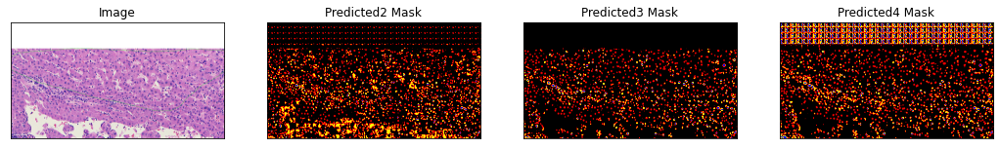

 14%|█▍        | 10/71 [04:46<52:06, 51.25s/it]

uint8
(300, 300, 3) (300, 300)
Uniques predicted [0 1 2 3] [0 1 2 3] [0 1 2 3]
case2-1-40_normal_300.jpg


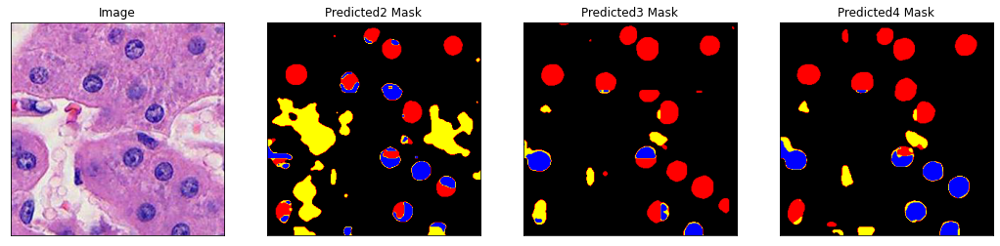

 15%|█▌        | 11/71 [04:49<36:37, 36.62s/it]

uint8
(96, 96, 3) (96, 96)
Uniques predicted [0 1 3] [0 1 2 3] [0 1 2 3]
case2-1-40_normal_96.jpg


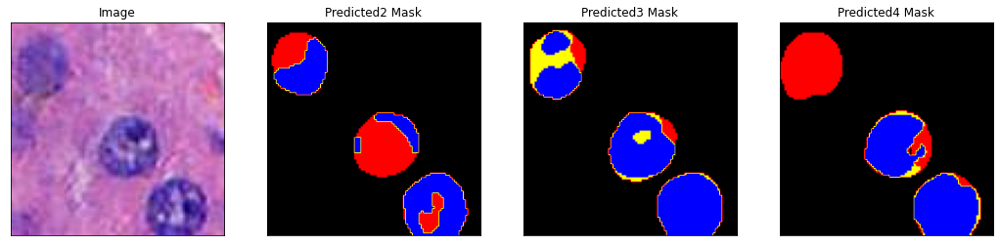

 17%|█▋        | 12/71 [04:49<25:19, 25.76s/it]

uint8
(512, 512, 3) (512, 512)
Uniques predicted [0 1 2 3] [0 1 2 3] [0 1 2 3]
case2-1-40_normal_crop.jpg


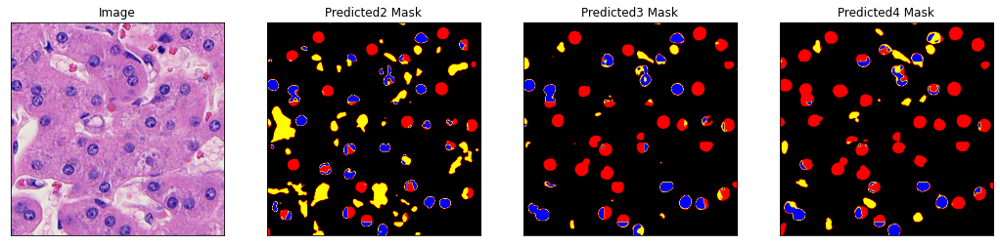

 18%|█▊        | 13/71 [04:54<18:41, 19.34s/it]

uint8
(392, 3636, 3) (392, 3636)
Uniques predicted [0 1 2 3] [0 1 2 3] [0 1 2 3]
case2-1-40_normal_cropped.jpg


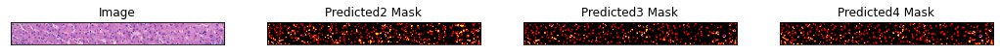

 20%|█▉        | 14/71 [05:15<19:02, 20.05s/it]

uint8
(1985, 3636, 3) (1985, 3636)
Uniques predicted [0 1 2 3] [0 1 2 3] [0 1 2 3]
case3-1-40_tumor.jpg


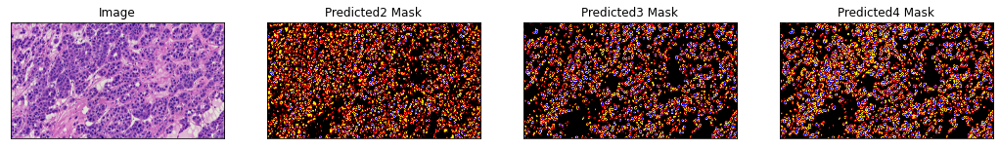

 21%|██        | 15/71 [06:47<38:48, 41.59s/it]

uint8
(300, 300, 3) (300, 300)
Uniques predicted [0 2 3] [0 2 3] [0 2 3]
case3-1-40_tumor_300.jpg


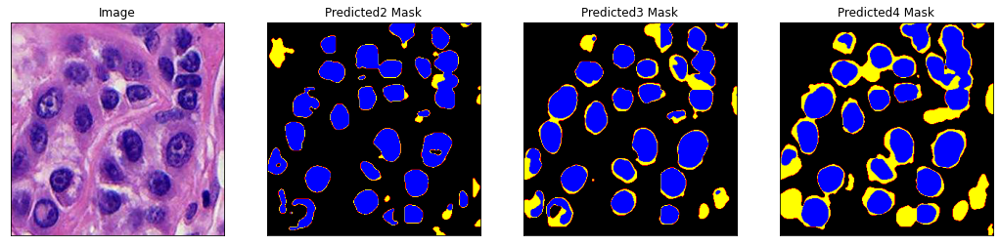

 23%|██▎       | 16/71 [06:49<27:15, 29.73s/it]

uint8
(96, 96, 3) (96, 96)
Uniques predicted [0 2 3] [0 2 3] [0 2 3]
case3-1-40_tumor_96.jpg


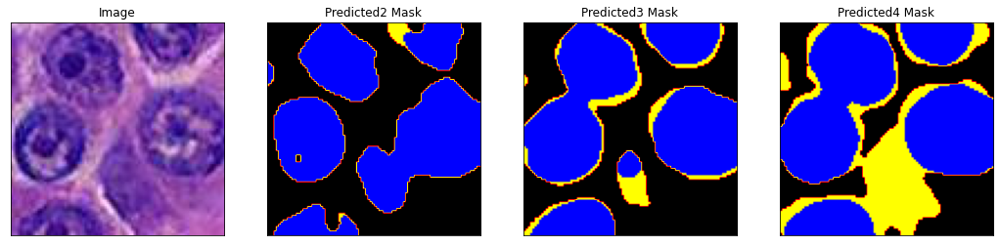

 24%|██▍       | 17/71 [06:50<18:50, 20.93s/it]

uint8
(512, 512, 3) (512, 512)
Uniques predicted [0 2 3] [0 2 3] [0 2 3]
case3-1-40_tumor_crop.jpg


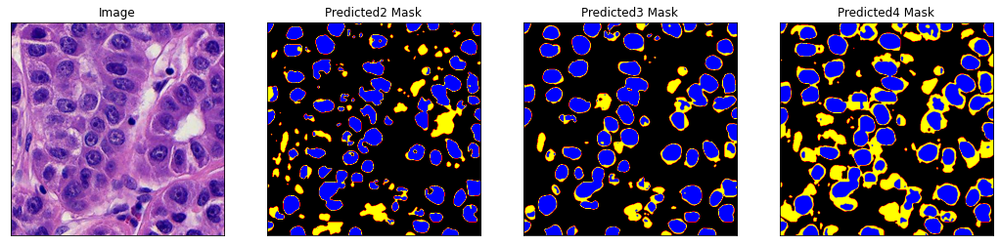

 25%|██▌       | 18/71 [06:54<14:11, 16.06s/it]

uint8
(1985, 3636, 3) (1985, 3636)
Uniques predicted [0 2 3] [0 2 3] [0 1 2 3]
case4-1-40_tumor.jpg


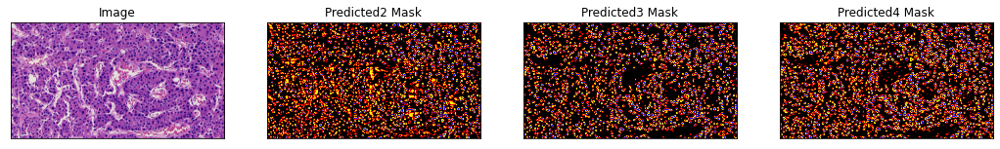

 27%|██▋       | 19/71 [08:26<33:32, 38.70s/it]

uint8
(300, 300, 3) (300, 300)
Uniques predicted [0 2 3] [0 2 3] [0 1 2 3]
case4-1-40_tumor_300.jpg


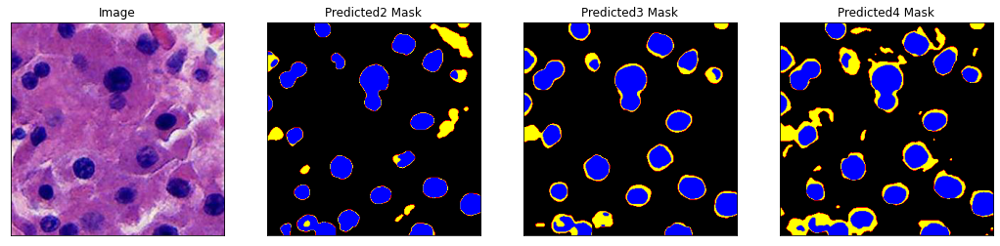

 28%|██▊       | 20/71 [08:28<23:33, 27.71s/it]

uint8
(96, 96, 3) (96, 96)
Uniques predicted [0 2 3] [0 2 3] [0 2 3]
case4-1-40_tumor_96.jpg


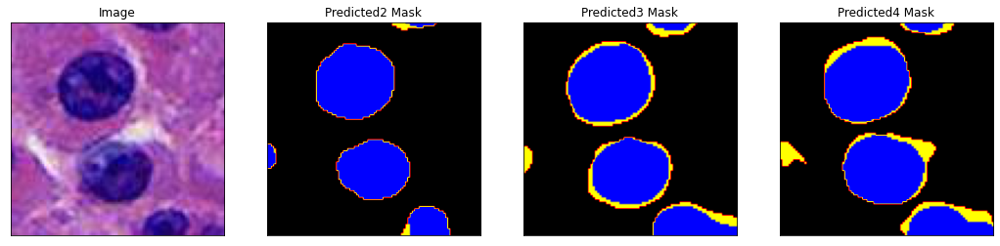

 30%|██▉       | 21/71 [08:28<16:15, 19.52s/it]

uint8
(512, 512, 3) (512, 512)
Uniques predicted [0 2 3] [0 2 3] [0 2 3]
case4-1-40_tumor_crop.jpg


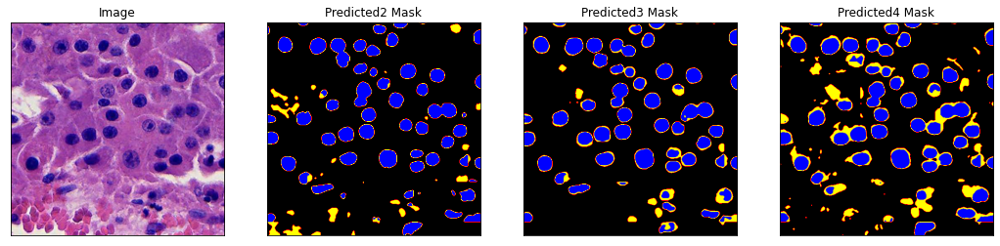

 31%|███       | 22/71 [08:33<12:12, 14.96s/it]

uint8
(1985, 3636, 3) (1985, 3636)
Uniques predicted [0 1 2 3] [0 2 3] [0 1 2 3]
case4-2-40_tumor.jpg


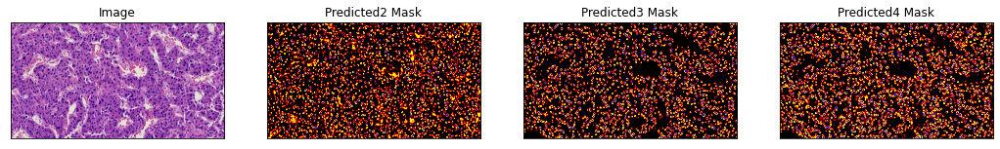

 32%|███▏      | 23/71 [10:04<30:17, 37.86s/it]

uint8
(300, 300, 3) (300, 300)
Uniques predicted [0 1 2 3] [0 2 3] [0 2 3]
case4-2-40_tumor_300.jpg


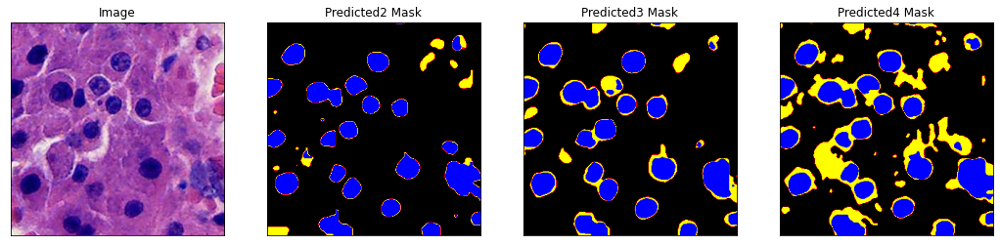

 34%|███▍      | 24/71 [10:06<21:14, 27.12s/it]

uint8
(96, 96, 3) (96, 96)
Uniques predicted [0 3] [0 2 3] [0 2 3]
case4-2-40_tumor_96.jpg


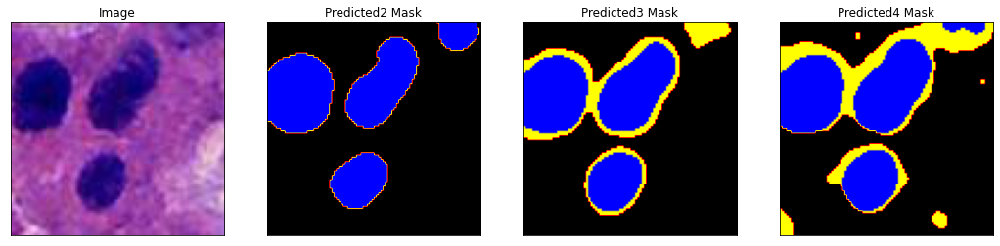

 35%|███▌      | 25/71 [10:06<14:38, 19.10s/it]

uint8
(512, 512, 3) (512, 512)
Uniques predicted [0 1 2 3] [0 2 3] [0 2 3]
case4-2-40_tumor_crop.jpg


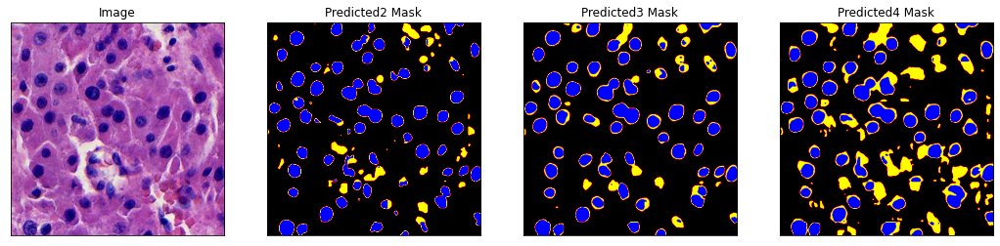

 37%|███▋      | 26/71 [10:11<11:00, 14.67s/it]

uint8
(1985, 3636, 3) (1985, 3636)
Uniques predicted [0 1 2 3] [0 1 2 3] [0 1 2 3]
case4-3-40_tumor.jpg


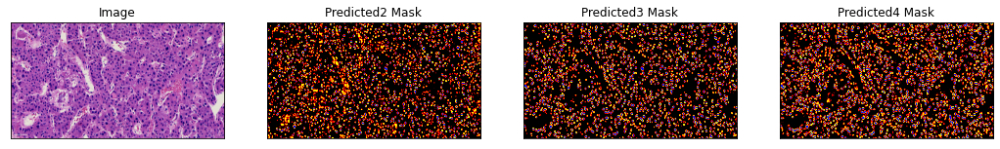

 38%|███▊      | 27/71 [11:42<27:39, 37.71s/it]

uint8
(96, 96, 3) (96, 96)
Uniques predicted [0 3] [0 2 3] [0 2 3]
case4-3-40_tumor_96.jpg


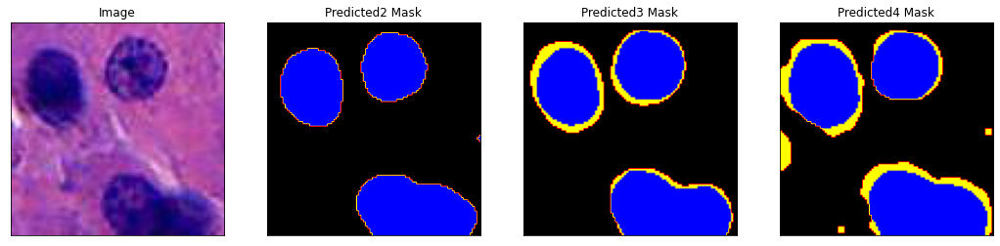

 39%|███▉      | 28/71 [11:43<19:00, 26.52s/it]

uint8
(512, 512, 3) (512, 512)
Uniques predicted [0 2 3] [0 2 3] [0 2 3]
case4-3-40_tumor_crop.jpg


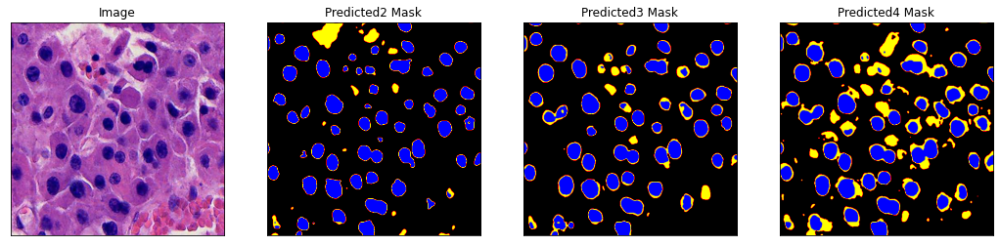

 41%|████      | 29/71 [11:47<13:59, 19.98s/it]

uint8
(259, 253, 3) (259, 253)
Uniques predicted [0 2 3] [0 2 3] [0 2 3]
case4-3-40_tumor_mid.jpg


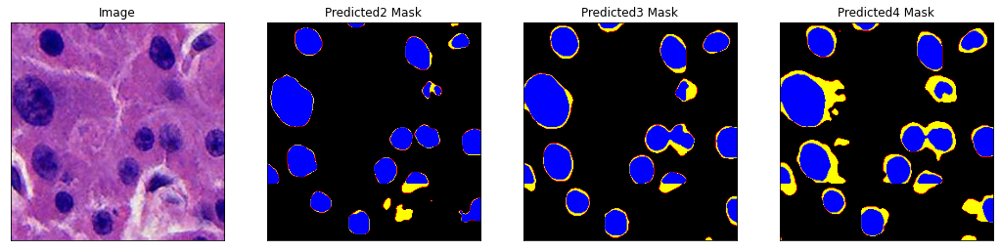

 42%|████▏     | 30/71 [11:49<09:49, 14.37s/it]

uint8
(1985, 3636, 3) (1985, 3636)
Uniques predicted [0 1 2 3] [0 1 2 3] [0 1 2 3]
case4-4-40_tumor.jpg


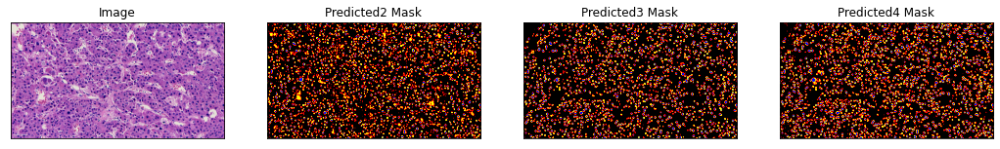

 44%|████▎     | 31/71 [13:20<24:56, 37.41s/it]

uint8
(96, 96, 3) (96, 96)
Uniques predicted [0 2 3] [0 2 3] [0 2 3]
case4-4-40_tumor_96.jpg


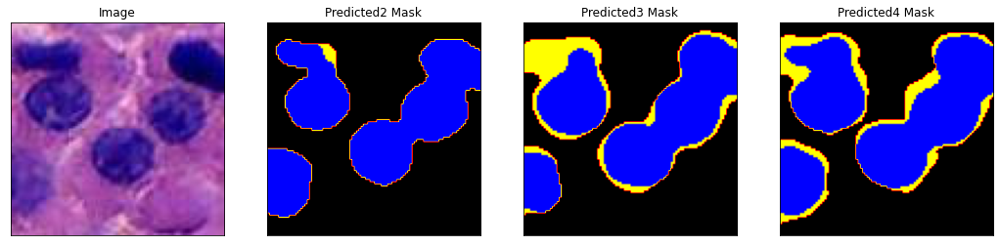

 45%|████▌     | 32/71 [13:20<17:05, 26.30s/it]

uint8
(512, 512, 3) (512, 512)
Uniques predicted [0 1 2 3] [0 2 3] [0 2 3]
case4-4-40_tumor_crop.jpg


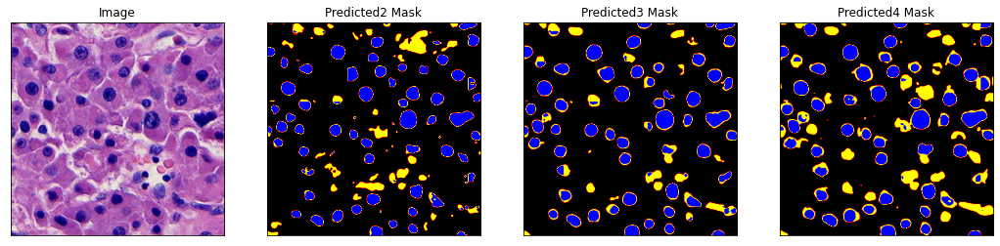

 46%|████▋     | 33/71 [13:24<12:28, 19.70s/it]

uint8
(291, 294, 3) (291, 294)
Uniques predicted [0 2 3] [0 2 3] [0 2 3]
case4-4-40_tumor_mid.jpg


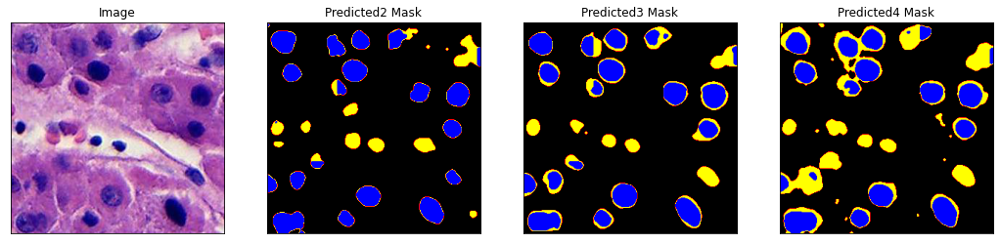

 48%|████▊     | 34/71 [13:26<08:52, 14.39s/it]

uint8
(1985, 3636, 3) (1985, 3636)
Uniques predicted [0 1 2 3] [0 1 2 3] [0 1 2 3]
case5-1-1-40_tumor.jpg


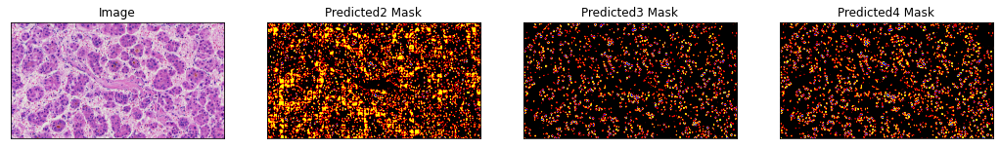

 49%|████▉     | 35/71 [14:57<22:25, 37.37s/it]

uint8
(96, 96, 3) (96, 96)
Uniques predicted [0 2 3] [0 2 3] [0 2 3]
case5-1-1-40_tumor_96.jpg


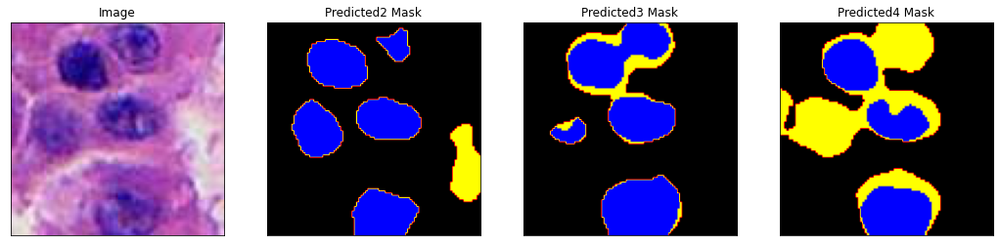

 51%|█████     | 36/71 [14:58<15:19, 26.28s/it]

uint8
(512, 512, 3) (512, 512)
Uniques predicted [0 1 2 3] [0 1 2 3] [0 1 2 3]
case5-1-1-40_tumor_crop.jpg


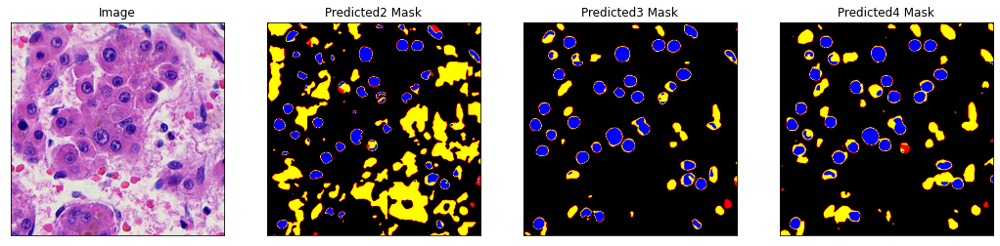

 52%|█████▏    | 37/71 [15:02<11:09, 19.70s/it]

uint8
(1985, 3636, 3) (1985, 3636)
Uniques predicted [0 1 2 3] [0 1 2 3] [0 1 2 3]
case5-1-2-40_tumor.jpg


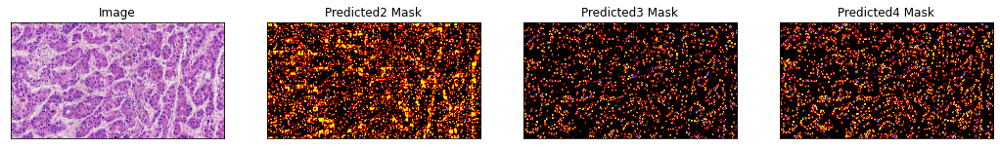

 54%|█████▎    | 38/71 [16:33<22:37, 41.13s/it]

uint8
(96, 96, 3) (96, 96)
Uniques predicted [0 2 3] [0 2 3] [0 2 3]
case5-1-2-40_tumor_96.jpg


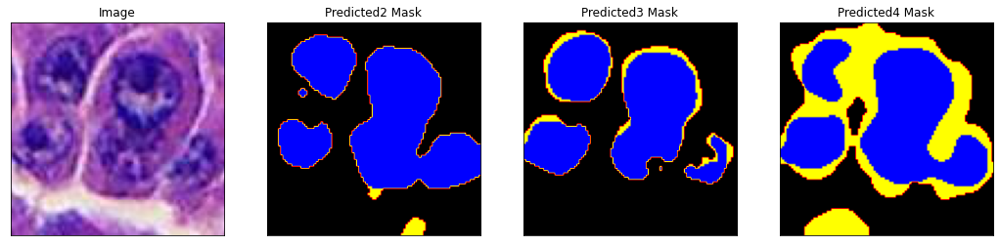

 55%|█████▍    | 39/71 [16:34<15:25, 28.91s/it]

uint8
(512, 512, 3) (512, 512)
Uniques predicted [0 1 2 3] [0 2 3] [0 1 2 3]
case5-1-2-40_tumor_crop.jpg


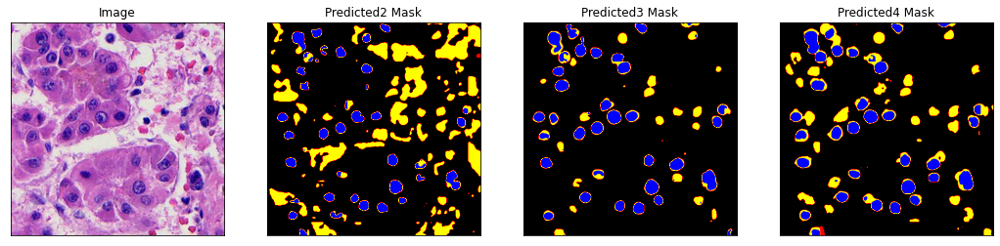

 56%|█████▋    | 40/71 [16:38<11:10, 21.64s/it]

uint8
(250, 264, 3) (250, 264)
Uniques predicted [0 1 2 3] [0 2 3] [0 2 3]
case5-1-2-40_tumor_mid.jpg


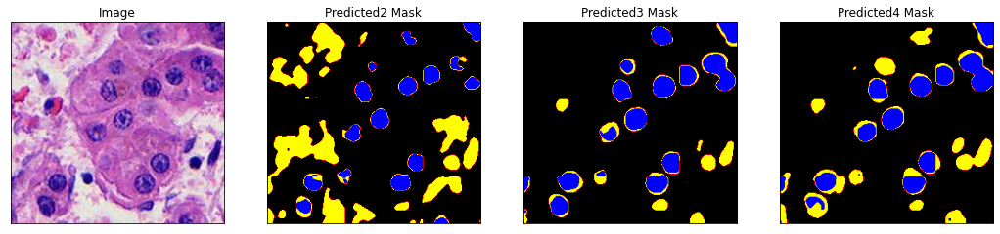

 58%|█████▊    | 41/71 [16:40<07:45, 15.52s/it]

uint8
(1985, 3636, 3) (1985, 3636)
Uniques predicted [0 1 2 3] [0 1 2 3] [0 1 2 3]
case5-1-40-1_fibrosis.jpg


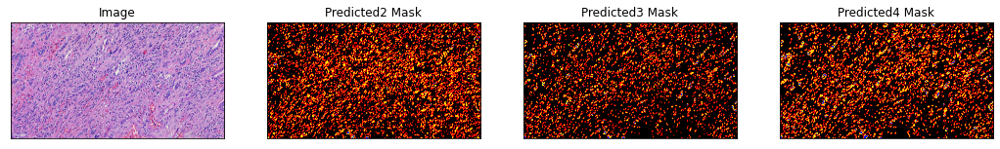

 59%|█████▉    | 42/71 [18:11<18:26, 38.16s/it]

uint8
(96, 96, 3) (96, 96)
Uniques predicted [0 2 3] [0 2 3] [0 2]
case5-1-40-1_fibrosis_96.jpg


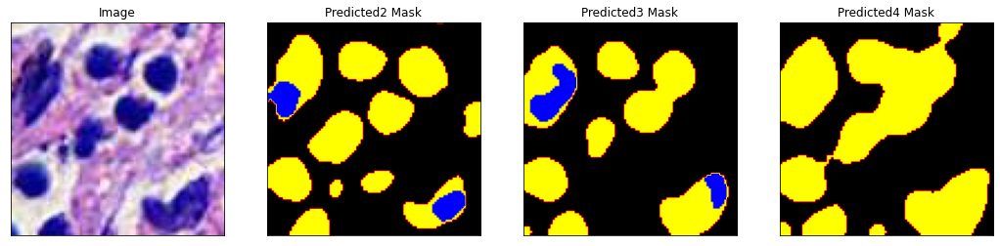

 61%|██████    | 43/71 [18:11<12:31, 26.83s/it]

uint8
(512, 512, 3) (512, 512)
Uniques predicted [0 1 2 3] [0 2 3] [0 2 3]
case5-1-40-1_fibrosis_crop.jpg


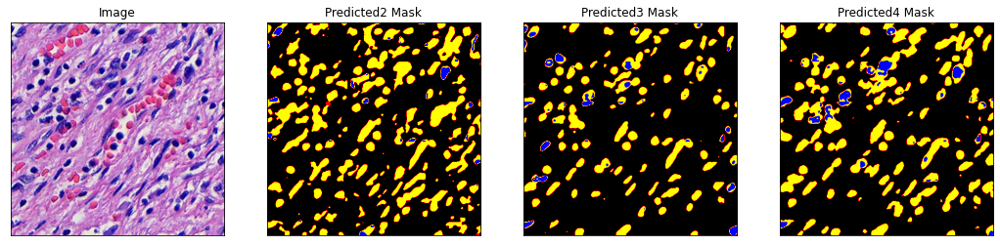

 62%|██████▏   | 44/71 [18:15<09:01, 20.07s/it]

uint8
(252, 240, 3) (252, 240)
Uniques predicted [0 2 3] [0 2 3] [0 2 3]
case5-1-40-1_fibrosis_mid.jpg


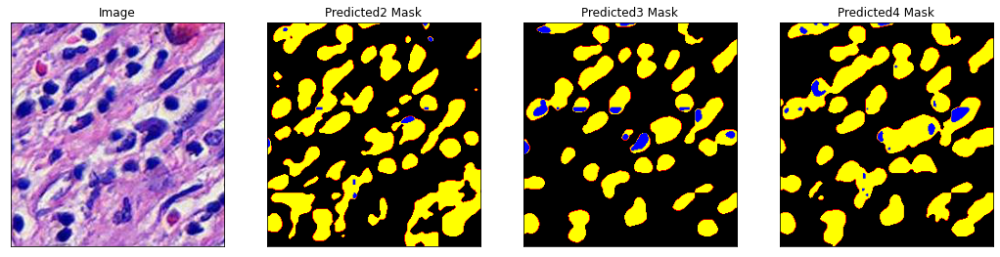

 63%|██████▎   | 45/71 [18:17<06:15, 14.43s/it]

uint8
(3636, 1985, 3) (3636, 1985)
Uniques predicted [0 1 2 3] [0 1 2 3] [0 1 2 3]
case5-1-40-1_normal.jpg


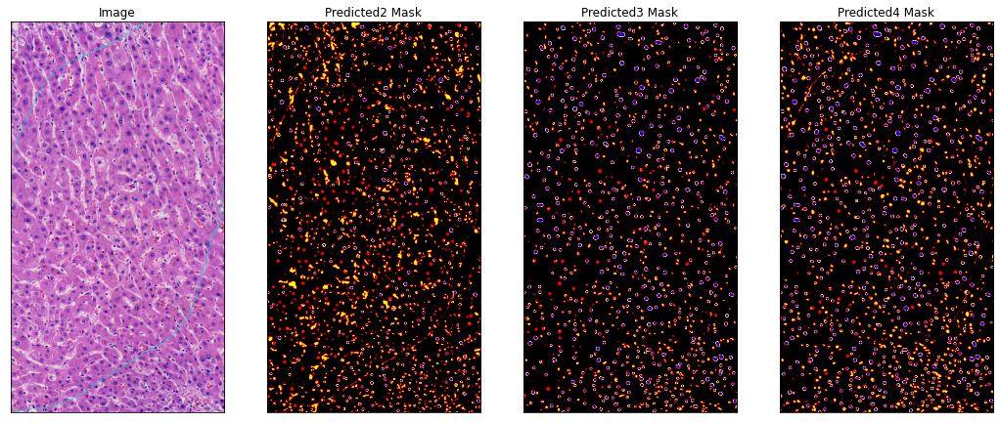

 65%|██████▍   | 46/71 [19:49<15:44, 37.76s/it]

uint8
(96, 96, 3) (96, 96)
Uniques predicted [0 1 2 3] [0 1 2 3] [0 2 3]
case5-1-40-1_normal_96.jpg


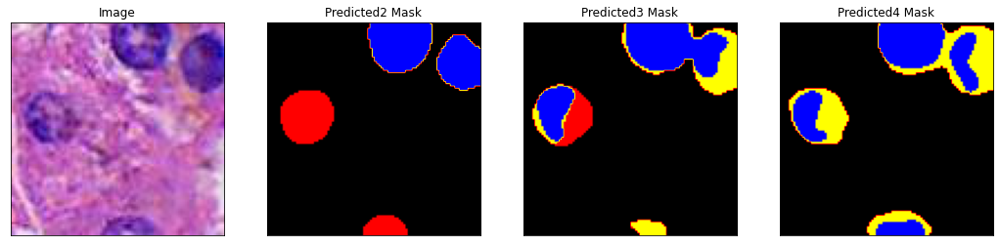

 66%|██████▌   | 47/71 [19:49<10:37, 26.55s/it]

uint8
(1245, 1384, 3) (1245, 1384)
Uniques predicted [0 1 2 3] [0 1 2 3] [0 1 2 3]
case5-1-40-1_normal_cropped1.jpg


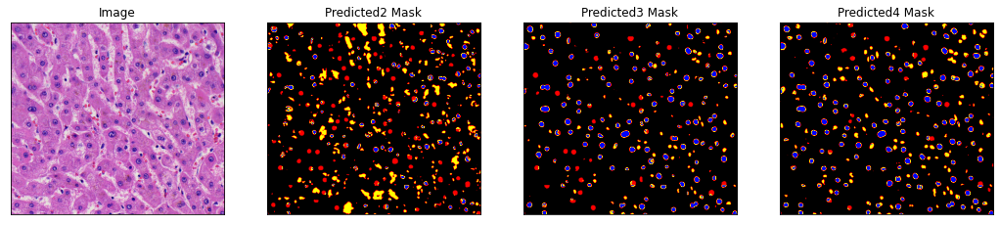

 68%|██████▊   | 48/71 [20:12<09:47, 25.53s/it]

uint8
(1237, 2201, 3) (1237, 2201)
Uniques predicted [0 1 2 3] [0 1 2 3] [0 1 2 3]
case5-1-40-1_normal_cropped2.jpg


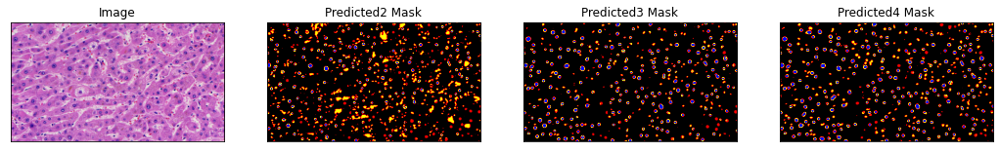

 69%|██████▉   | 49/71 [20:47<10:21, 28.25s/it]

uint8
(1985, 3636, 3) (1985, 3636)
Uniques predicted [0 1 2 3] [0 1 2 3] [0 1 2 3]
case5-1-40-2_fibrosis.jpg


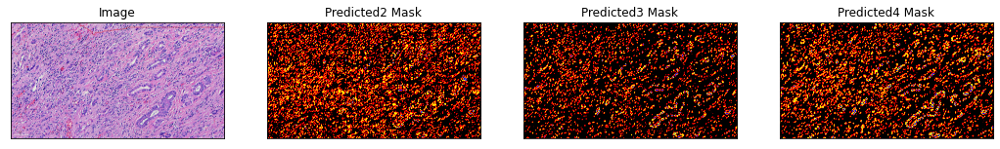

 70%|███████   | 50/71 [22:19<16:35, 47.39s/it]

uint8
(96, 96, 3) (96, 96)
Uniques predicted [0 2 3] [0 2 3] [0 2 3]
case5-1-40-2_fibrosis_96.jpg


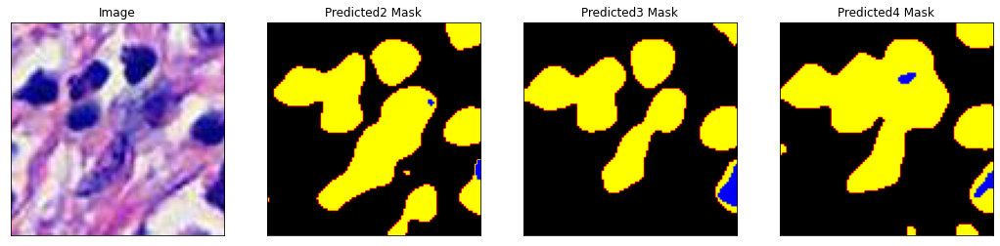

 72%|███████▏  | 51/71 [22:19<11:05, 33.29s/it]

uint8
(1769, 3338, 3) (1769, 3338)
Uniques predicted [0 1 2 3] [0 1 2 3] [0 1 2 3]
case5-1-40-3_fibrosis.jpg


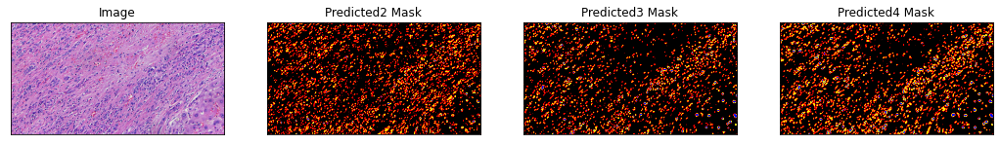

 73%|███████▎  | 52/71 [23:35<14:35, 46.09s/it]

uint8
(96, 96, 3) (96, 96)
Uniques predicted [0 2 3] [0 2 3] [0 2 3]
case5-1-40-3_fibrosis_96.jpg


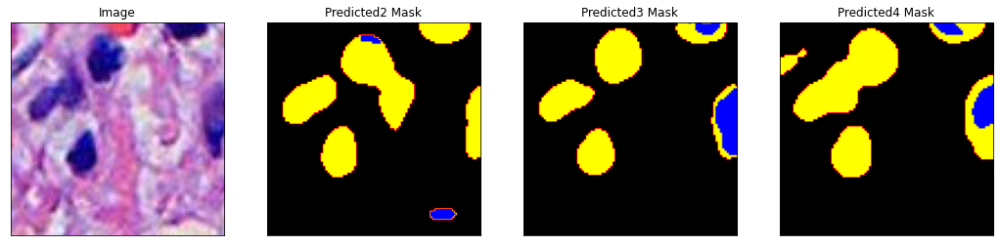

 75%|███████▍  | 53/71 [23:36<09:42, 32.38s/it]

uint8
(512, 512, 3) (512, 512)
Uniques predicted [0 2 3] [0 2 3] [0 2 3]
case5-1-40-3_fibrosis_crop.jpg


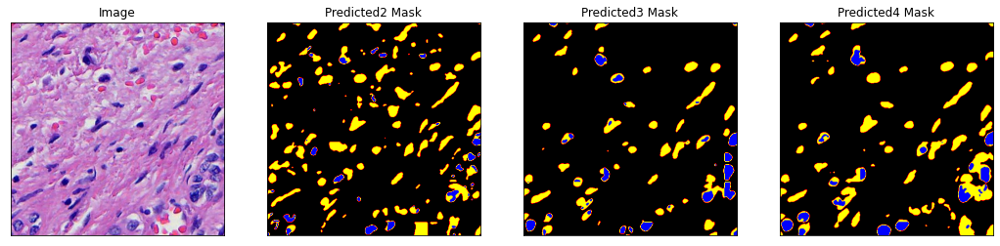

 76%|███████▌  | 54/71 [23:40<06:49, 24.07s/it]

uint8
(269, 285, 3) (269, 285)
Uniques predicted [0 2 3] [0 2 3] [0 2 3]
case5-1-40-3_fibrosis_mid.jpg


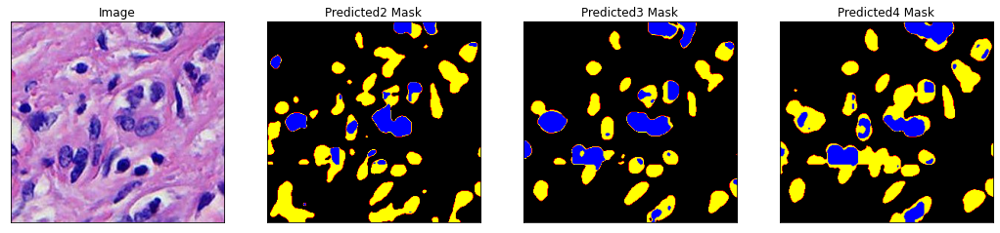

 77%|███████▋  | 55/71 [23:42<04:35, 17.23s/it]

uint8
(1985, 3636, 3) (1985, 3636)
Uniques predicted [0 1 2 3] [0 1 2 3] [0 1 2 3]
case5_2_1_30_tumor.jpg


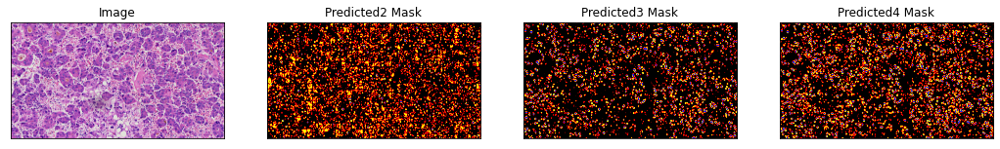

 79%|███████▉  | 56/71 [25:13<09:52, 39.53s/it]

uint8
(1564, 3158, 3) (1564, 3158)
Uniques predicted [0 1 2 3] [0 1 2 3] [0 1 2 3]
case5_2_2_30_tumor.jpg


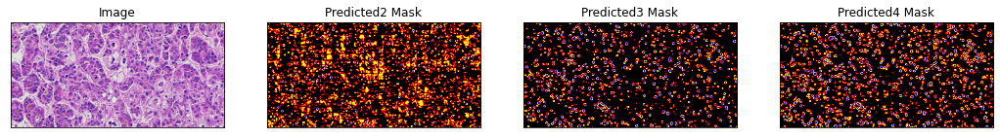

 80%|████████  | 57/71 [26:19<11:03, 47.37s/it]

uint8
(96, 96, 3) (96, 96)
Uniques predicted [0 1 2 3] [0 2 3] [0 2 3]
case5_2_2_30_tumor_96.jpg


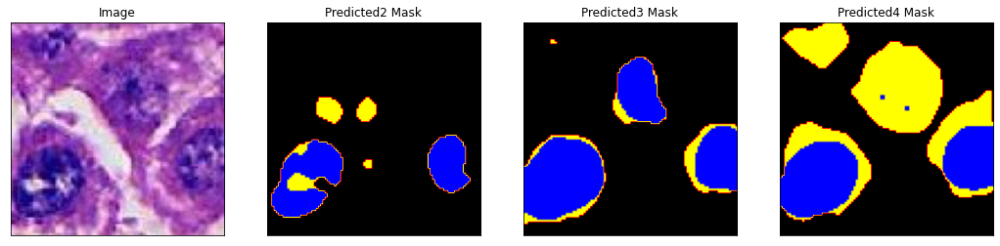

 82%|████████▏ | 58/71 [26:19<07:12, 33.28s/it]

uint8
(334, 354, 3) (334, 354)
Uniques predicted [0 1 2 3] [0 2 3] [0 2 3]
case5_2_2_30_tumor_mid.jpg


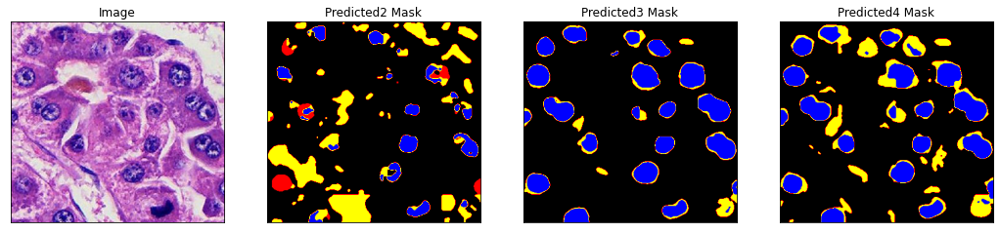

 83%|████████▎ | 59/71 [26:22<04:47, 23.97s/it]

uint8
(1985, 3636, 3) (1985, 3636)
Uniques predicted [0 1 2 3] [0 1 2 3] [0 1 2 3]
case5_2_2_40_tumor.jpg


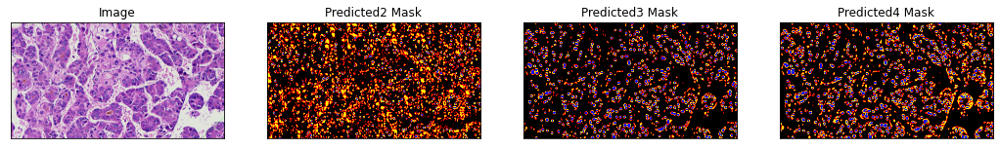

 85%|████████▍ | 60/71 [27:53<08:07, 44.30s/it]

uint8
(1985, 3636, 3) (1985, 3636)
Uniques predicted [0 1 2 3] [0 1 2 3] [0 1 2 3]
case5_2_3_30_tumor.jpg


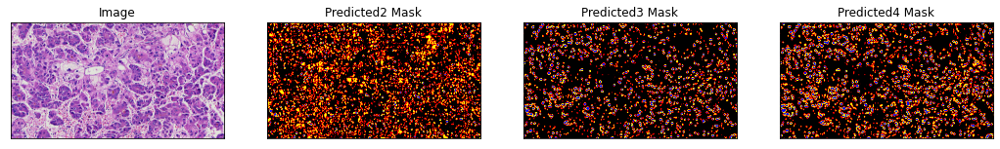

 86%|████████▌ | 61/71 [29:25<09:45, 58.54s/it]

uint8
(1985, 3636, 3) (1985, 3636)
Uniques predicted [0 1 2 3] [0 1 2 3] [0 1 2 3]
case5_2_3_40_tumor.jpg


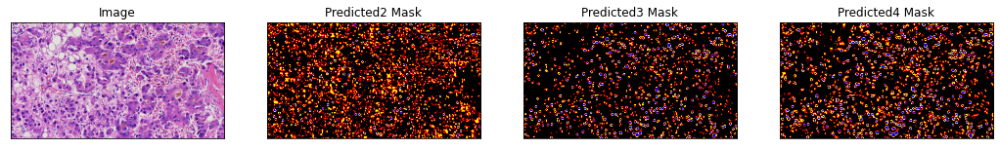

 87%|████████▋ | 62/71 [30:56<10:15, 68.37s/it]

uint8
(96, 96, 3) (96, 96)
Uniques predicted [0 2 3] [0 2 3] [0 2 3]
case5_2_3_40_tumor_96.jpg


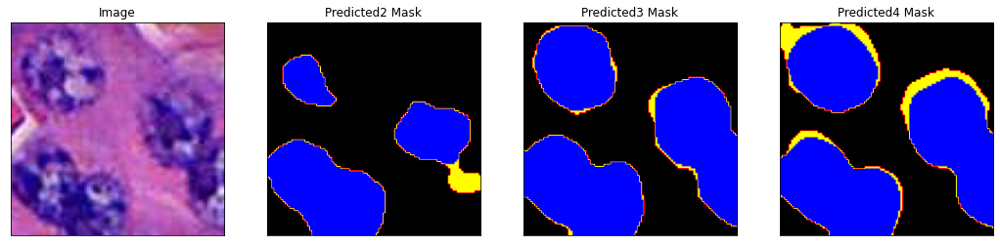

 89%|████████▊ | 63/71 [30:57<06:23, 47.98s/it]

uint8
(512, 512, 3) (512, 512)
Uniques predicted [0 1 2 3] [0 1 2 3] [0 2 3]
case5_2_3_40_tumor_crop.jpg


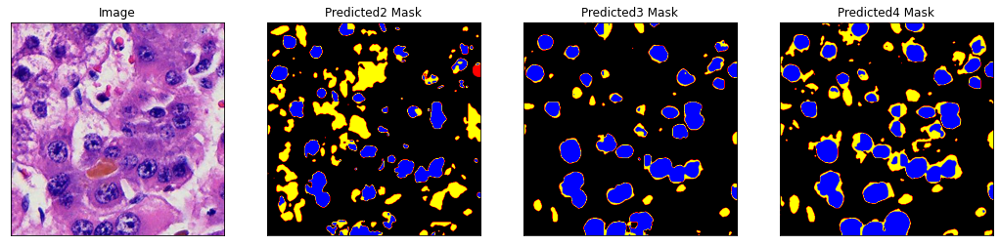

 90%|█████████ | 64/71 [31:01<04:04, 34.88s/it]

uint8
(324, 324, 3) (324, 324)
Uniques predicted [0 2 3] [0 2 3] [0 2 3]
case5_2_3_40_tumor_mid.jpg


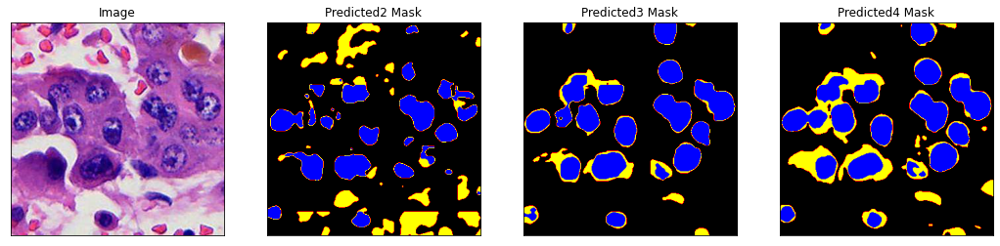

 92%|█████████▏| 65/71 [31:03<02:30, 25.04s/it]

In [ ]:
for i in tqdm(range(len(image_fns[:]))):

    image = skimage.io.imread(os.path.join(test_dataset_path, image_fns[i]))
    #print("Image shape:", image.shape)

    pred2, pred3, pred4 = whole_slide_predict(image)
    print(pred2.dtype)

    # Post processing to refine predictions
    pred_filt2 = cv2.medianBlur(pred2.astype(np.uint8), 5)
    pred_filt3 = cv2.medianBlur(pred3.astype(np.uint8), 5)
    pred_filt4 = cv2.medianBlur(pred4.astype(np.uint8), 5)

    print(image.shape, pred2.shape)
    print("Uniques predicted", np.unique(pred2), np.unique(pred3), np.unique(pred4))
    print(image_fns[i])

    #visualize_results(image, pred)

    visualize(
            image_fns[i],
            image=image,
            Predicted2_mask = pred_filt2,
            Predicted3_mask = pred_filt3,
            Predicted4_mask = pred_filt4,
        )

    
    assert image.shape[:2] == pred2.shape, "Image missmatch"